In [1]:
import pandas as pd
import numpy as np
import librosa
import librosa.core
import librosa.feature
import librosa.display
import matplotlib.pyplot as plt
import warnings

from pyod.models.iforest import IForest
from pyod.models.knn import KNN
from pyod.models.lof import LOF
from pyod.models.gmm import GMM
from pyod.models.ocsvm import OCSVM
from pyod.models.auto_encoder_torch import AutoEncoder
from pyod.models.vae import VAE
from pyod.models.inne import INNE
from pyod.models.copod import COPOD
from pyod.models.cblof import CBLOF

from mydataset import MyDataset

pd.set_option('max_colwidth',120)
warnings.filterwarnings('ignore')

## Dataset

In [2]:
# dataset

target_dir_mydataset = r'datasets\my_dataset'
dir_name_mydataset_anomaly = None
dir_name_mydataset_normal = r'\flac'

dataset_ts = MyDataset(target_dir_mydataset, dir_name_mydataset_normal, dir_name_mydataset_anomaly, extraction_type='melspectrogram', n_mel=64)
X_train, y_train, file_names = dataset_ts.data, dataset_ts.labels, dataset_ts.file_list

100%|██████████| 2100/2100 [06:14<00:00,  5.61it/s]


In [3]:
print(f'dataset_size: {X_train.shape}')
X_train = X_train.reshape(X_train.shape[0], X_train.shape[2] * X_train.shape[3])
print(f'dataset_reshaped_size: {X_train.shape}')

dataset_size: (2100, 1, 64, 224)
dataset_reshaped_size: (2100, 14336)


# Melspectrograms plotting

In [4]:
# Melspectrogram ploting

def plot_melspectr(file_name, sr=22050, mono=True, n_mels=128, fmax=10000):
    y, sr = librosa.load(file_name, sr=sr, mono=mono)
    S = librosa.feature.melspectrogram(y=y,
                                       sr=sr,
                                       n_mels=128,
                                       fmax=fmax)

    plt.figure(figsize=(8, 4))
    S_dB = librosa.power_to_db(S, ref=np.max)
    img = librosa.display.specshow(S_dB,
                                   x_axis='time',
                                   y_axis='mel',
                                   sr=sr,
                                   fmax=10000)
    plt.colorbar(img, format='%+2.0f dB')
    plt.title(f'{str(file_name)[-25:]}', fontsize=20)
    plt.xlabel('Time [seconds]',fontsize=15)
    plt.ylabel('Frequency [Hz]',fontsize=15)
    plt.show()

# Models ensemble

In [5]:
# Most anomalies and most normal by models ensemble

def PyOD_models_ensemble(X_train, contamination=0.1):
    
    models = {'LOF': LOF(contamination=contamination),
              'GMM': GMM(contamination=contamination),
              'INNE': INNE(contamination=contamination), 
              'CBLOF': CBLOF(contamination=contamination),
              'IForest': IForest(contamination=contamination)
              }

    anomalies = pd.DataFrame(
        columns=['anomaly_score', 'file_name'])
    normal = pd.DataFrame(
        columns=['anomaly_score', 'file_name'])
    for model_name, clf in models.items():

        clf = models[model_name]
        clf.fit(X_train)

        # get the anomaly score on the train data
        y_train_scores = clf.decision_scores_
        anomaly_scores = pd.DataFrame(y_train_scores, columns=['anomaly_score'])
        anomaly_scores['file_name'] = file_names
        anomaly_scores = anomaly_scores.sort_values(by='anomaly_score', ascending=False)
        anomalies = anomalies.append(anomaly_scores[:50])
        normal = normal.append(anomaly_scores[-50:])

    return anomalies, normal



In [6]:
anomalies, normal  = PyOD_models_ensemble(X_train, contamination=0.1)

In [7]:
anomalies_agg = anomalies.groupby('file_name', as_index=False)['anomaly_score'].count()
anomalies_agg = anomalies_agg.sort_values(by='anomaly_score', ascending=False)

# Top 10 anomaly sounds
most_anomaly = list(anomalies_agg['file_name'].astype(str).values[:10])

normal_agg = normal.groupby('file_name', as_index=False)['anomaly_score'].count()
normal_agg = normal_agg.sort_values(by='anomaly_score', ascending=False)

# Top 10 anomaly sounds
most_normal = list(normal_agg['file_name'].astype(str).values[:10])

print(f'Most Anomaly files:')
[print(f'{i}') for i in most_anomaly]

print(f'\n Most Normal files:')
[print(f'{i}') for i in most_normal]

Most Anomaly files:
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-172614.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-171859.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-173511.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-172720.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-172557.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-172743.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-172303.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-165857.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-172201.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-172955.flac

 Most Normal files:
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_2

[None, None, None, None, None, None, None, None, None, None]

## Top 10 anomaly sounds by models ensemble

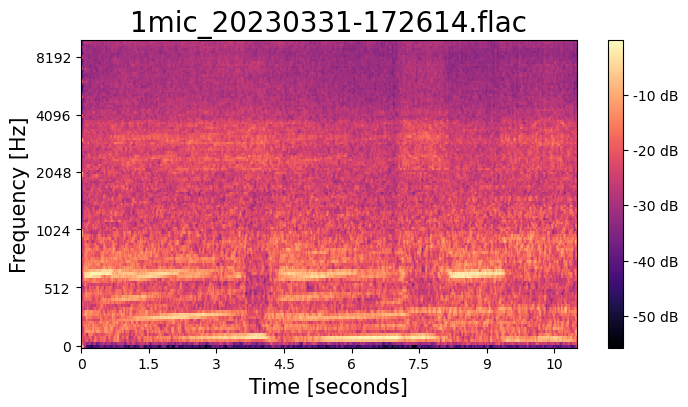

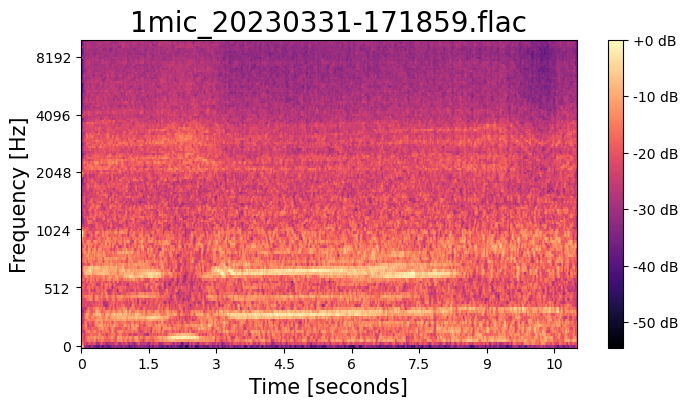

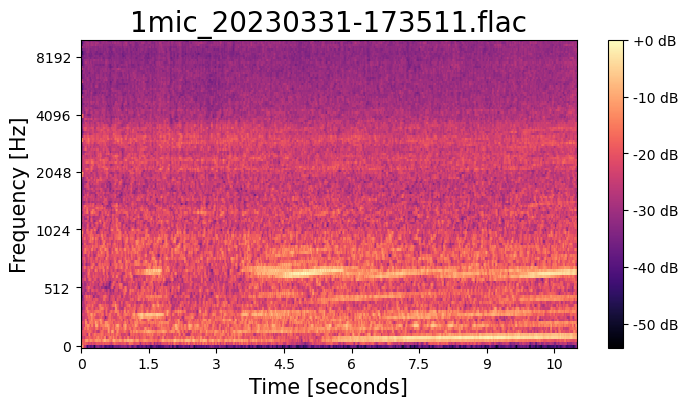

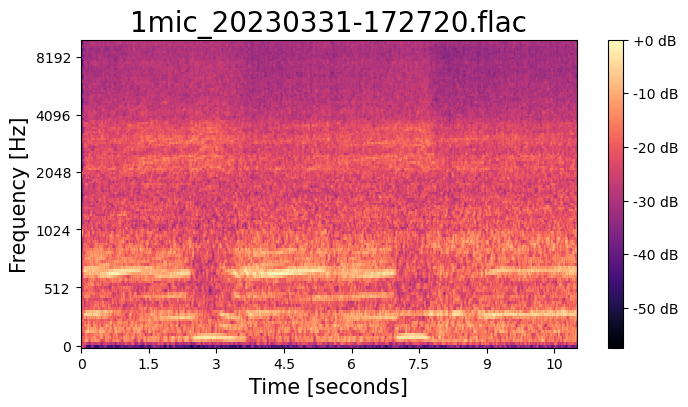

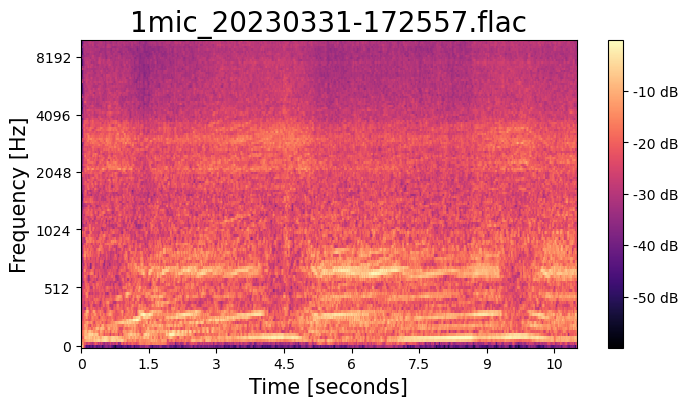

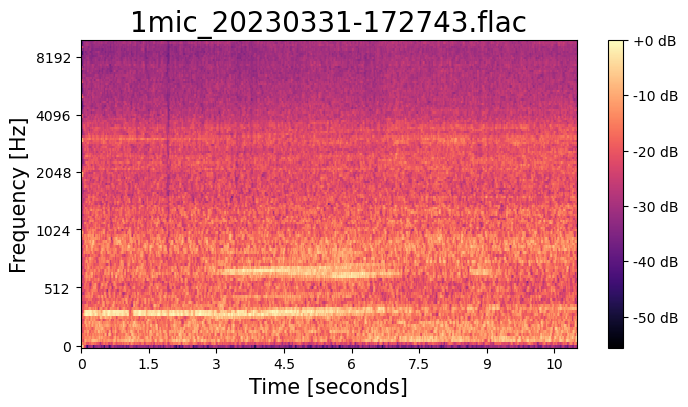

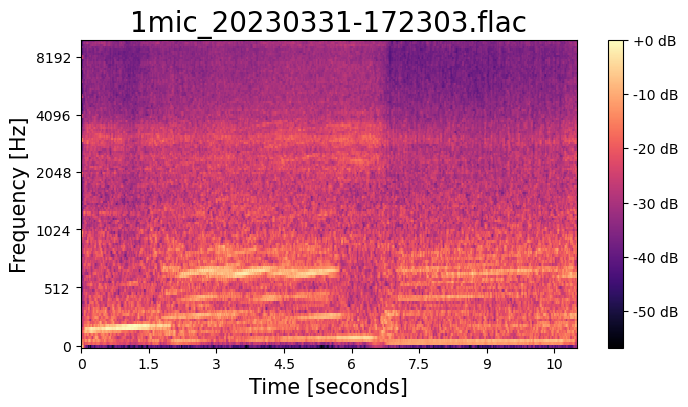

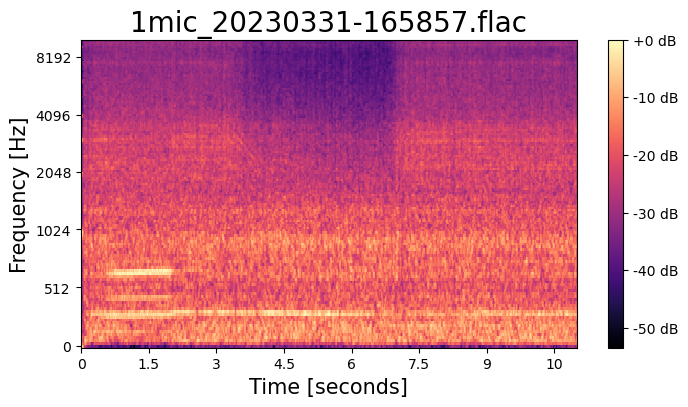

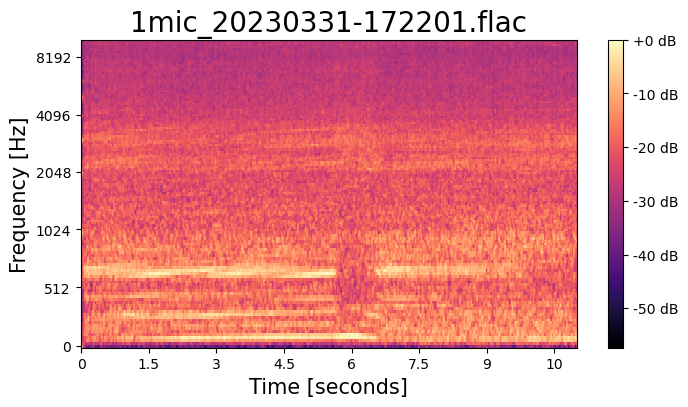

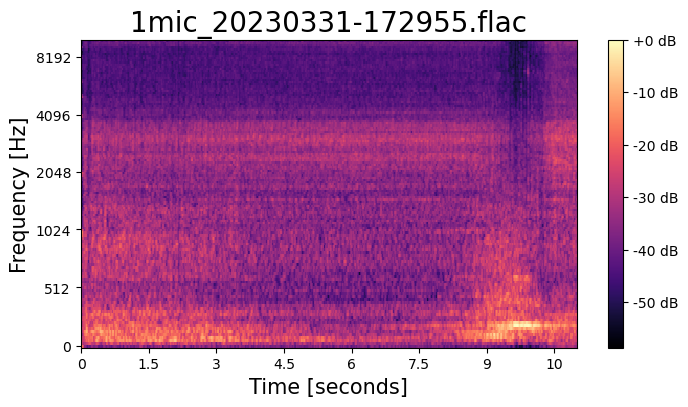

In [8]:
for f in most_anomaly:
    plot_melspectr(f, sr=22050, mono=True, n_mels=128, fmax=10000)

## Top 10 normal sounds by models ensemble

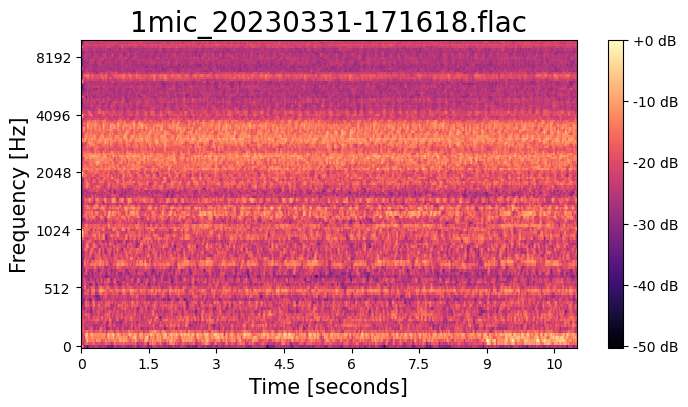

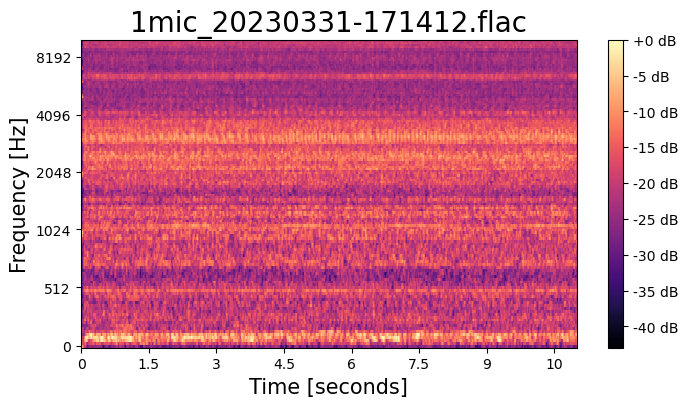

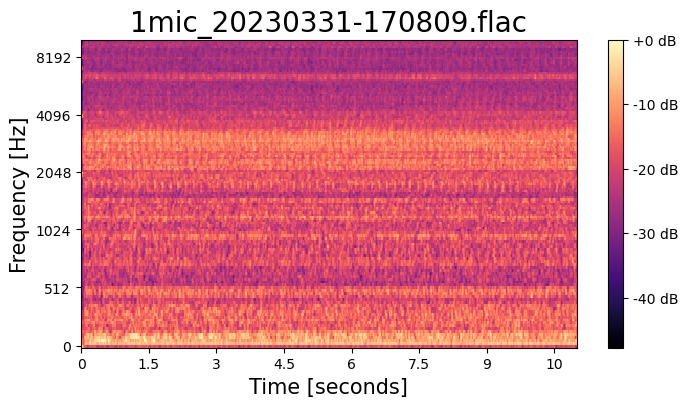

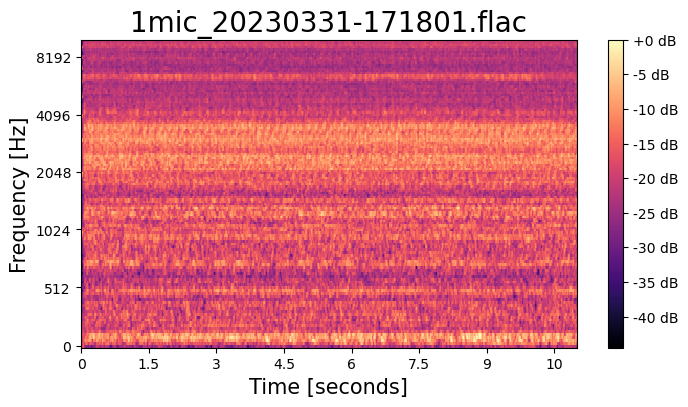

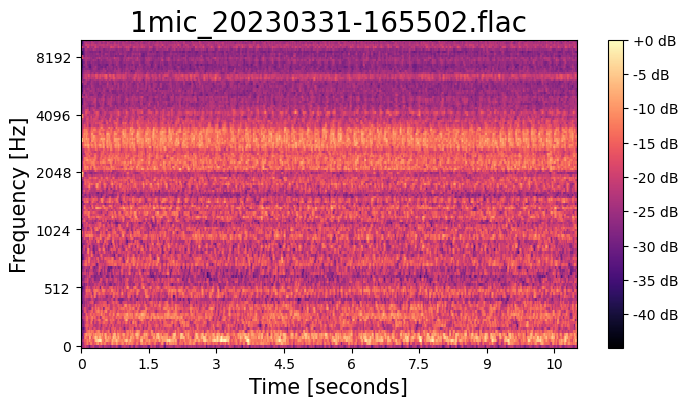

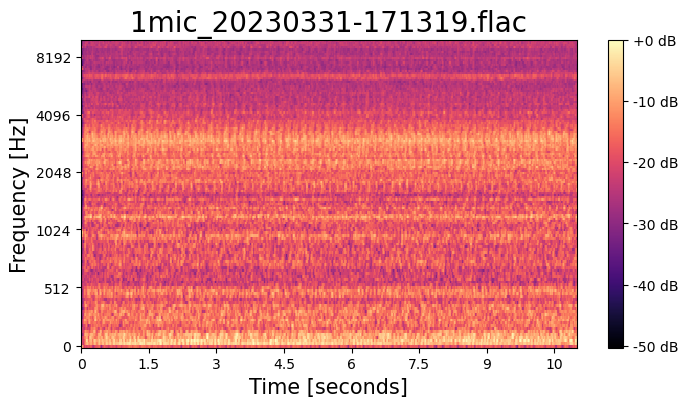

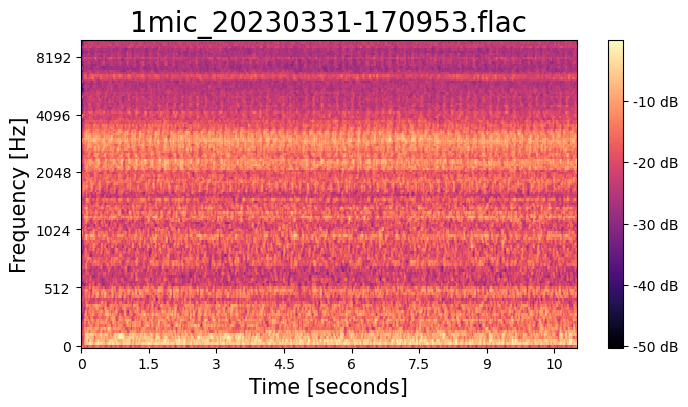

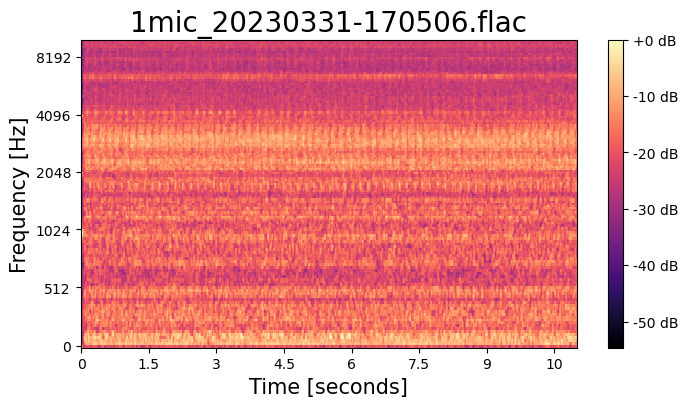

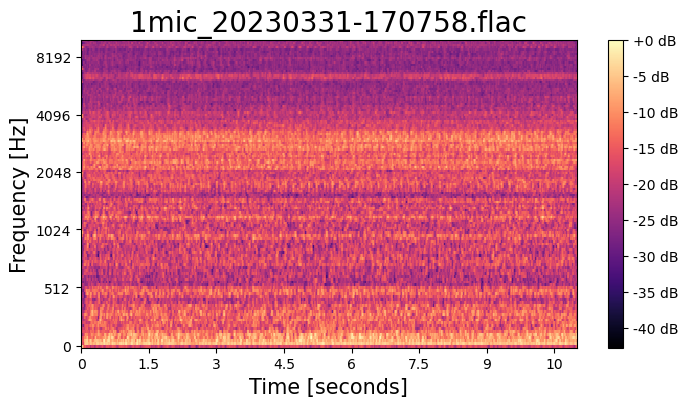

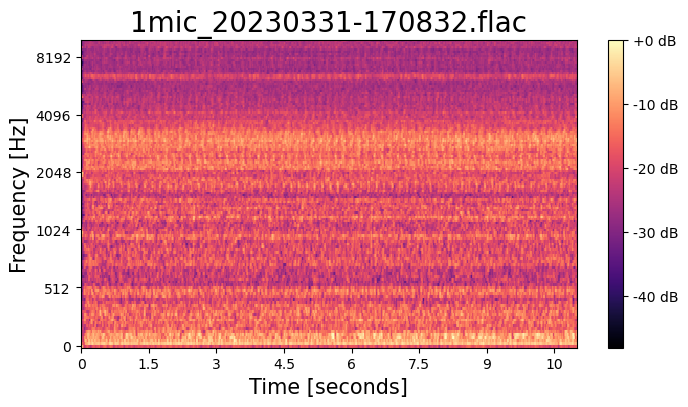

In [9]:
for f in most_normal:
    plot_melspectr(f, sr=22050, mono=True, n_mels=128, fmax=10000)

# Local Outlier Factor (LOF)

In [10]:
lof_clf = LOF(contamination=0.1)
lof_clf.fit(X_train)
# get the anomaly score on the train data
y_train_scores_lof = lof_clf.decision_function(X_train) 
anomaly_scores_lof = pd.DataFrame(y_train_scores_lof, columns=['anomaly_score'])
anomaly_scores_lof['file_name'] = file_names

In [11]:
anomaly_scores_lof = anomaly_scores_lof.sort_values(by='anomaly_score', ascending=False)

# Top 10 anomaly sounds
most_anomaly_lof = list(anomaly_scores_lof['file_name'].astype(str).values[:10])

# Top 10 normal sounds
most_normal_lof = list(anomaly_scores_lof['file_name'].astype(str).values[-10:])
print(f'Most Anomaly files:')
[print(f'{i}') for i in most_anomaly_lof]

print(f'\n Most Normal files:')
[print(f'{i}') for i in most_normal_lof]

Most Anomaly files:
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-171825.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-171814.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-165343.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-170815.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-173724.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-165935.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-173758.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-170106.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-171047.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-171532.flac

 Most Normal files:
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_2

[None, None, None, None, None, None, None, None, None, None]

In [12]:
# Melspectrogram ploting

def plot_melspectr(file_name, sr=22050, mono=True, n_mels=128, fmax=10000):
    y, sr = librosa.load(file_name, sr=sr, mono=mono)
    S = librosa.feature.melspectrogram(y=y, sr=sr,
                                       n_mels=128,
                                       fmax=fmax)

    plt.figure(figsize=(12, 5))
    S_dB = librosa.power_to_db(S, ref=np.max)
    img = librosa.display.specshow(S_dB, x_axis='time',
                                   y_axis='mel', sr=sr,
                                   fmax=10000)
    plt.colorbar(img, format='%+2.0f dB')
    plt.title(f'{str(file_name)[-25:]}', fontsize=20)
    plt.xlabel('Time [seconds]',fontsize=15)
    plt.ylabel('Frequency [Hz]',fontsize=15)
    plt.show()

## Top 10 anomaly sounds by LOF

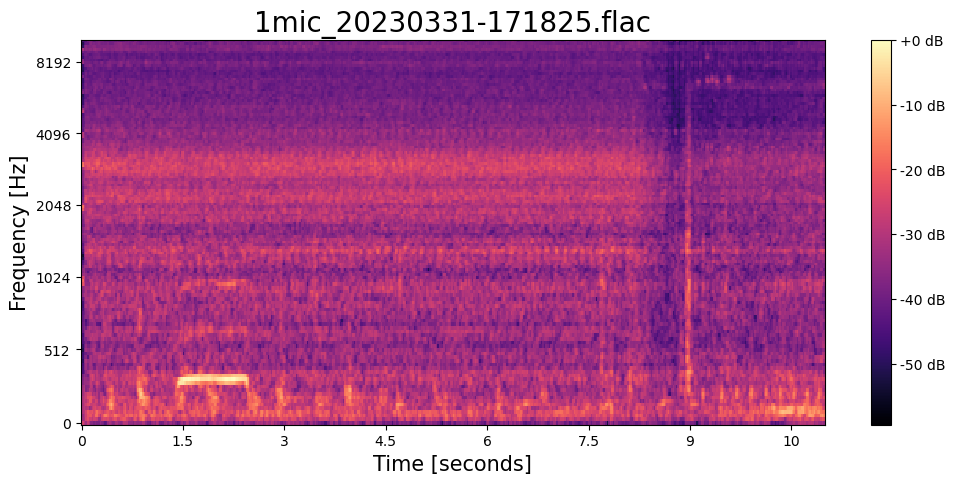

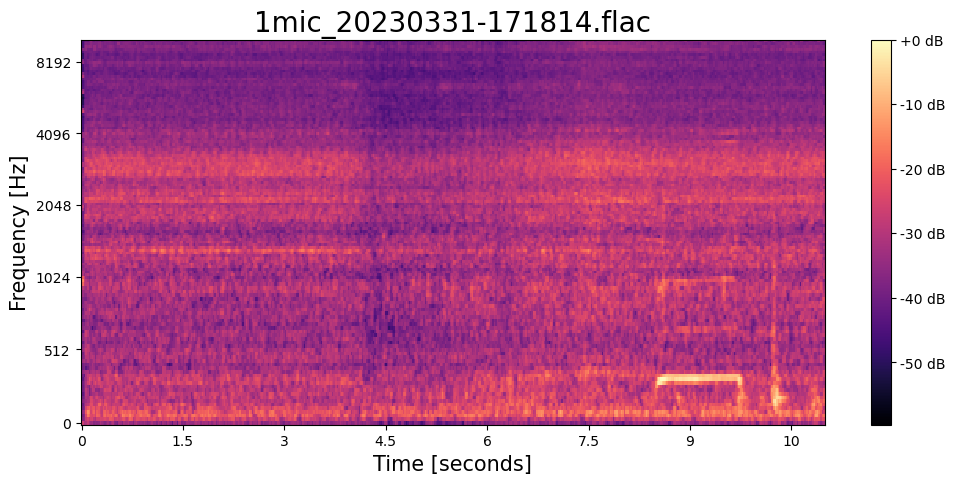

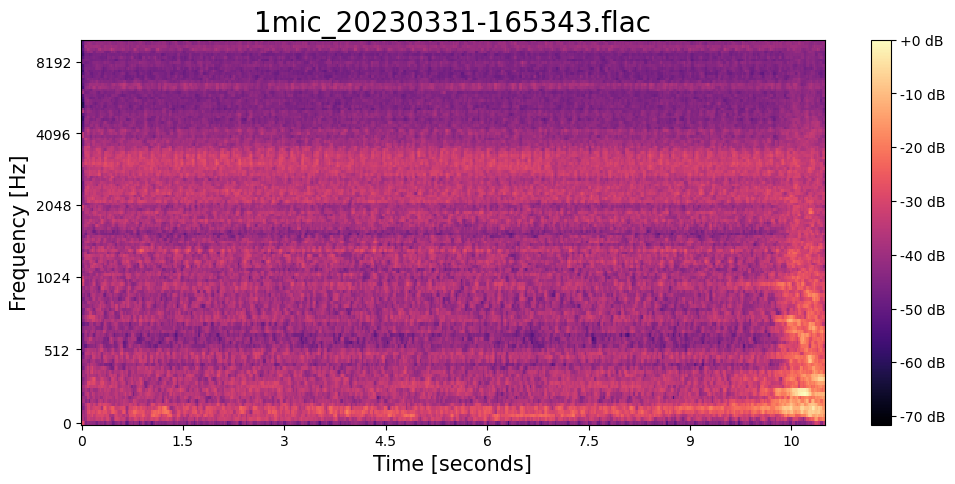

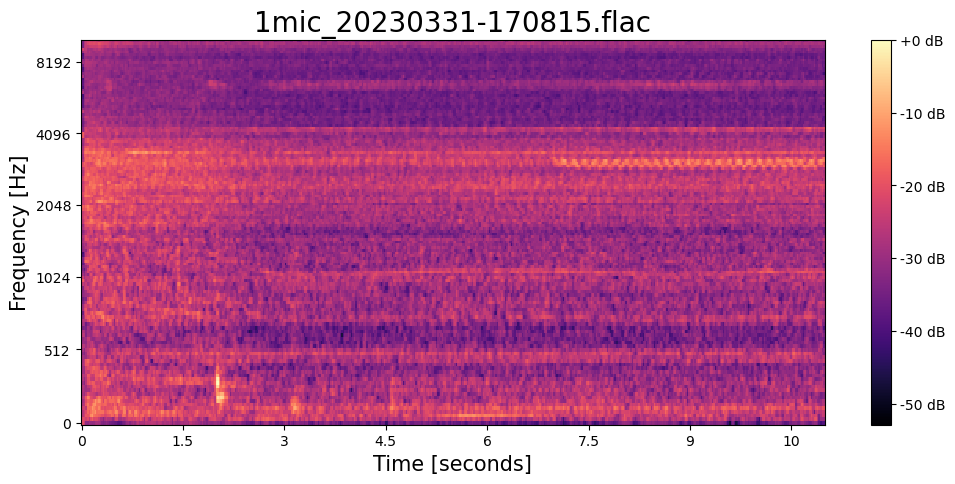

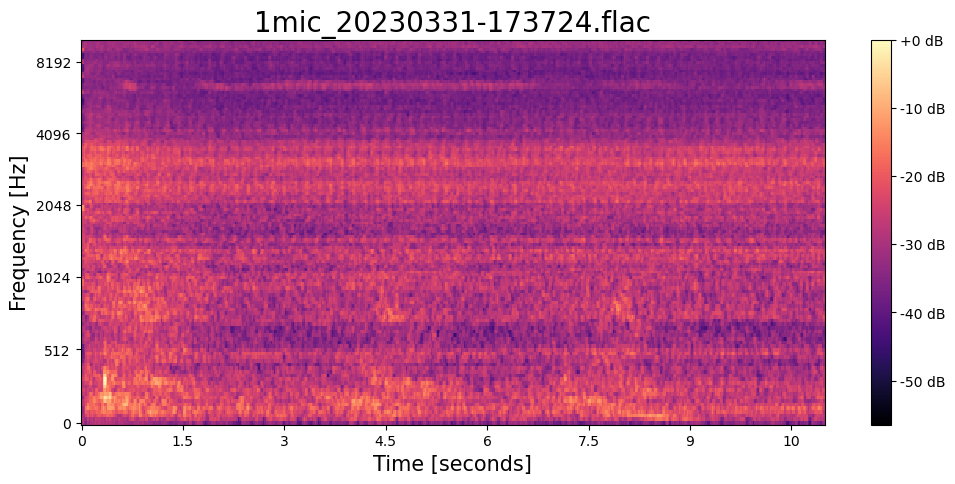

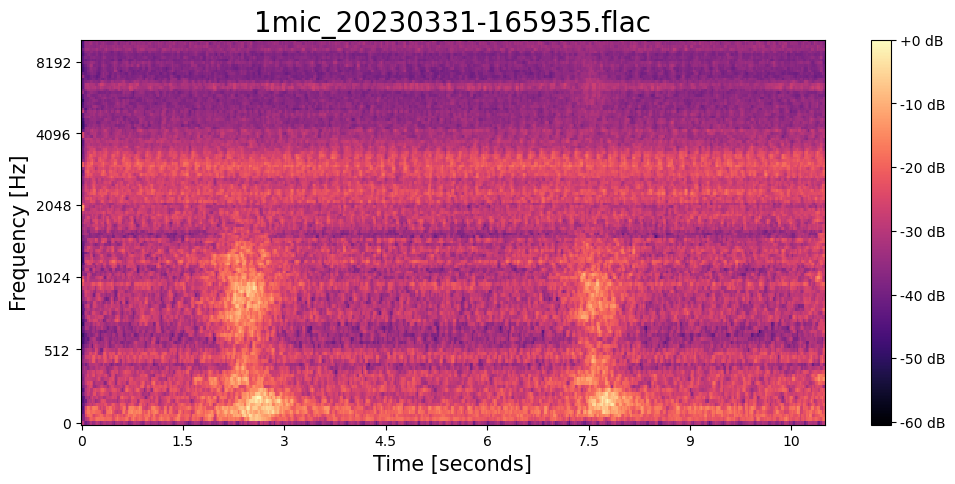

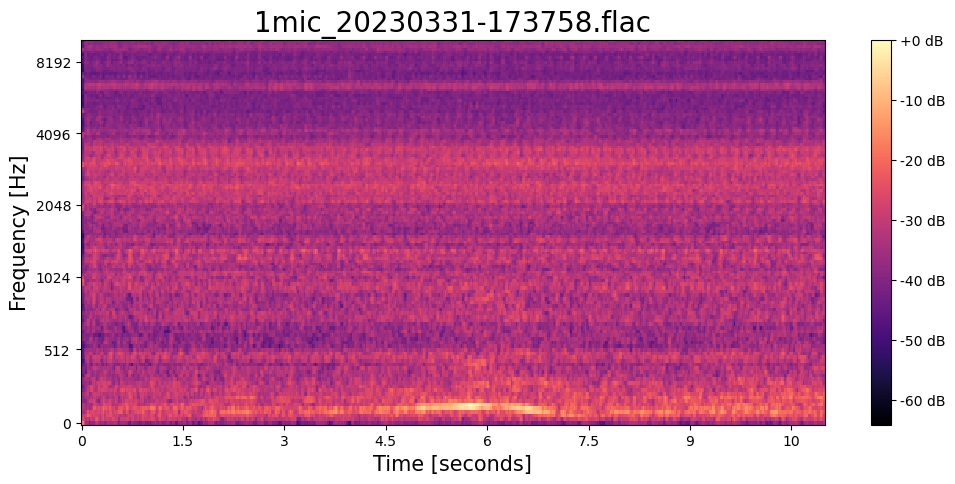

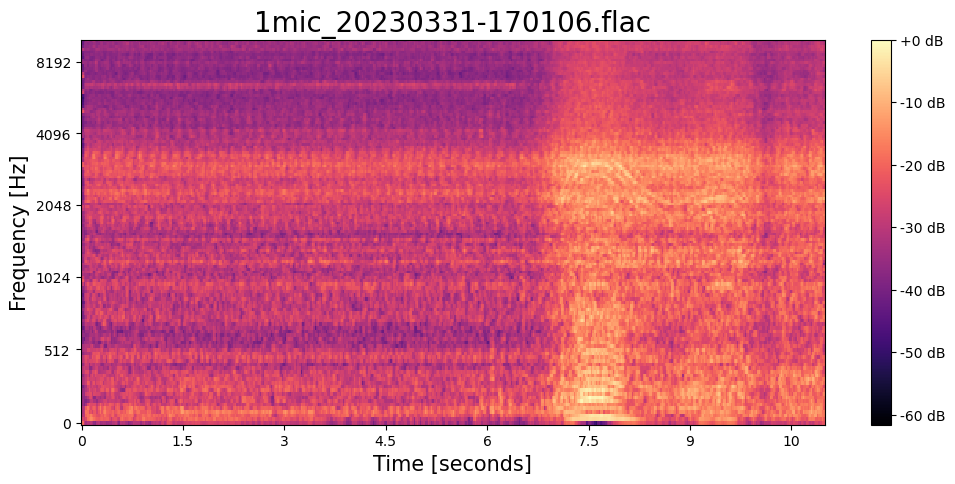

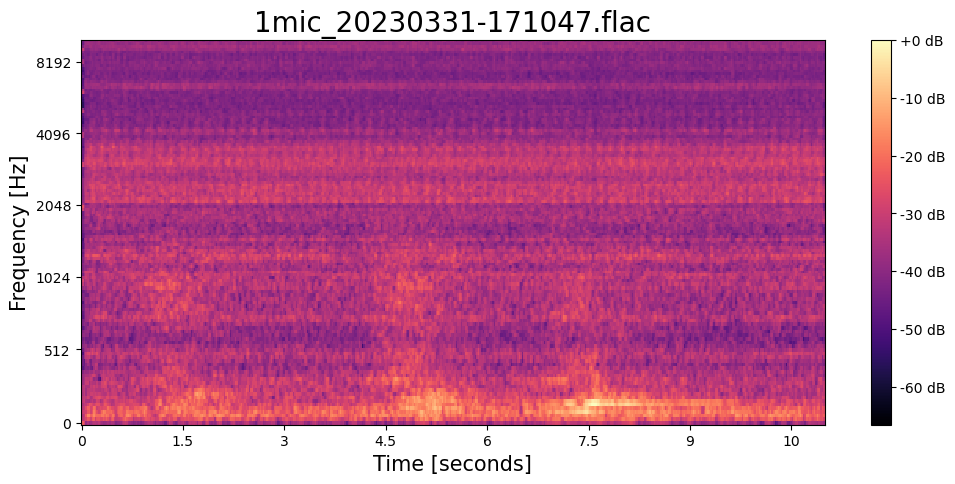

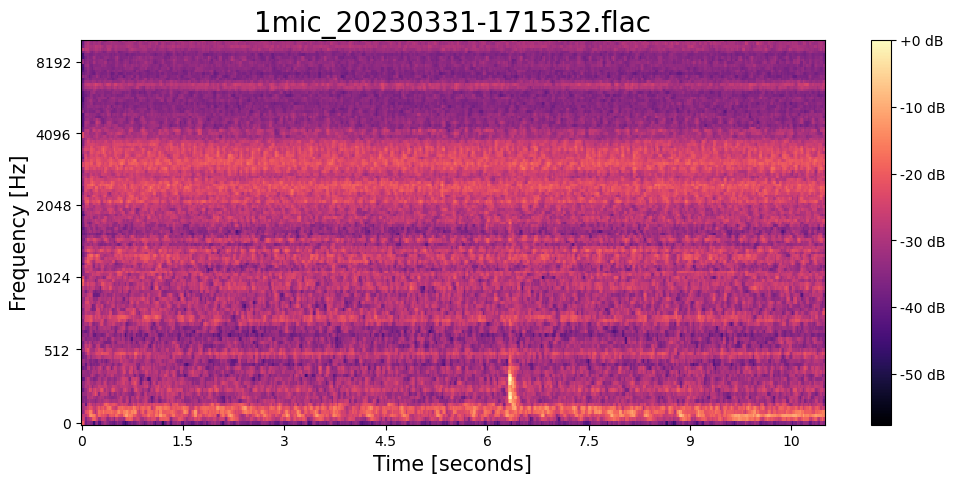

In [13]:
for f in most_anomaly_lof:
    plot_melspectr(f, sr=22050, mono=True, n_mels=128, fmax=10000)

## TOP 10 Normal sounds

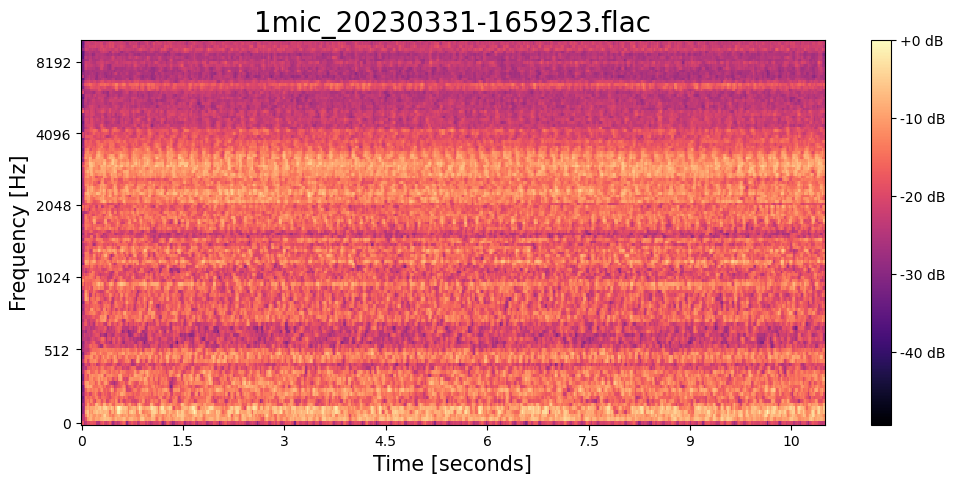

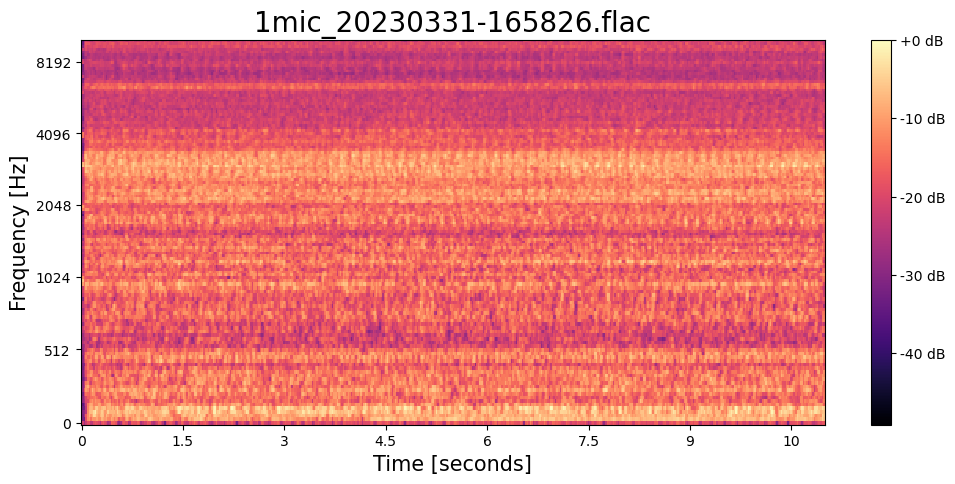

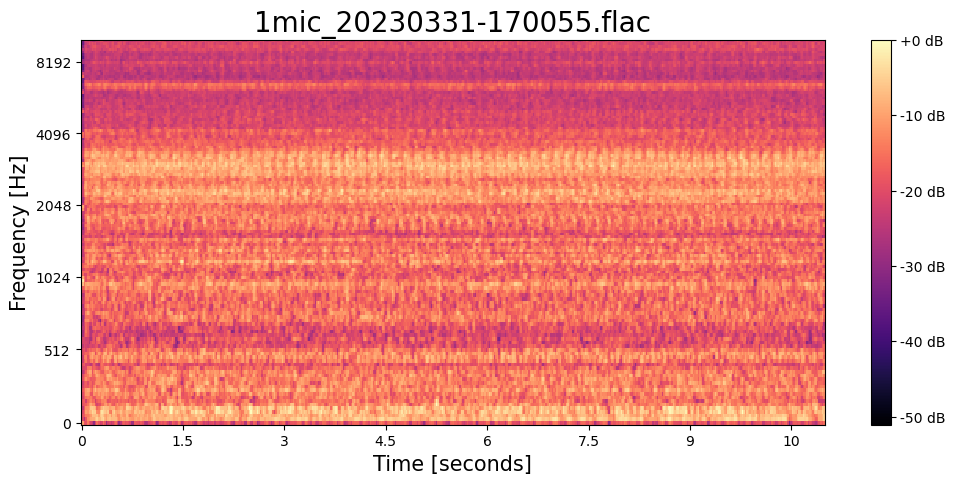

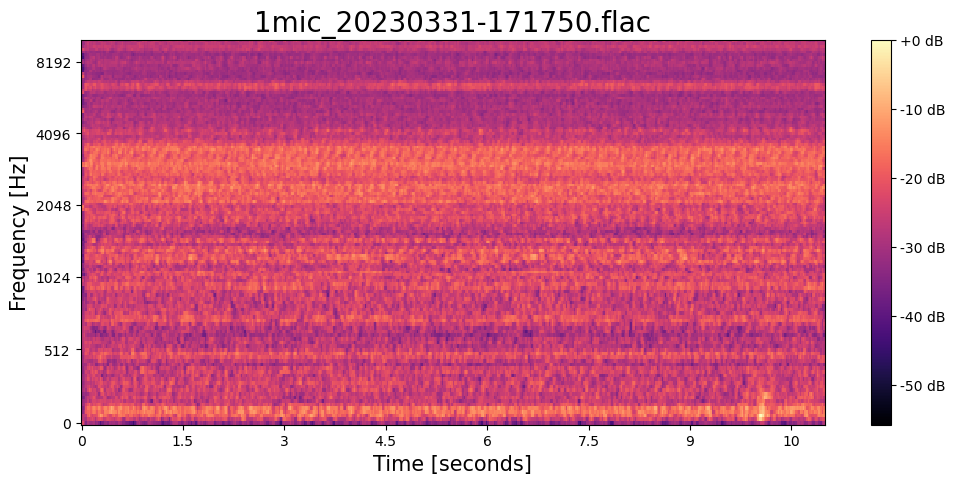

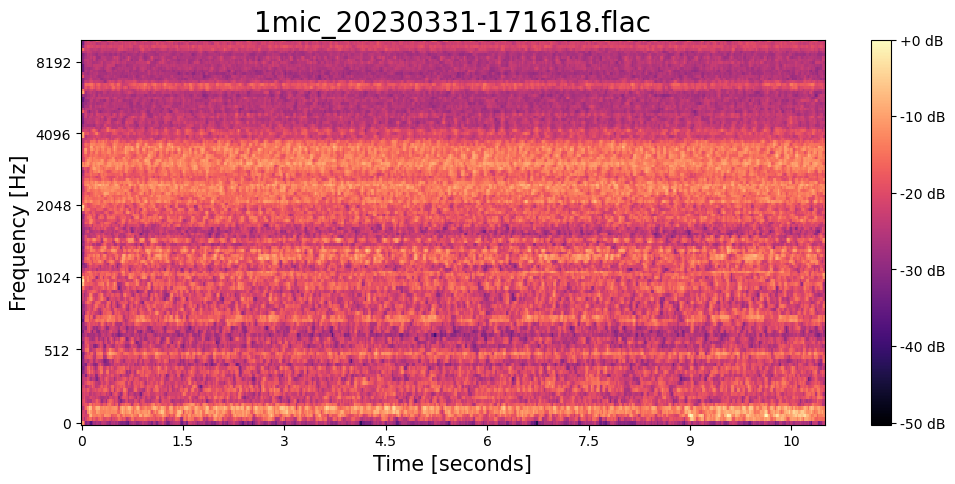

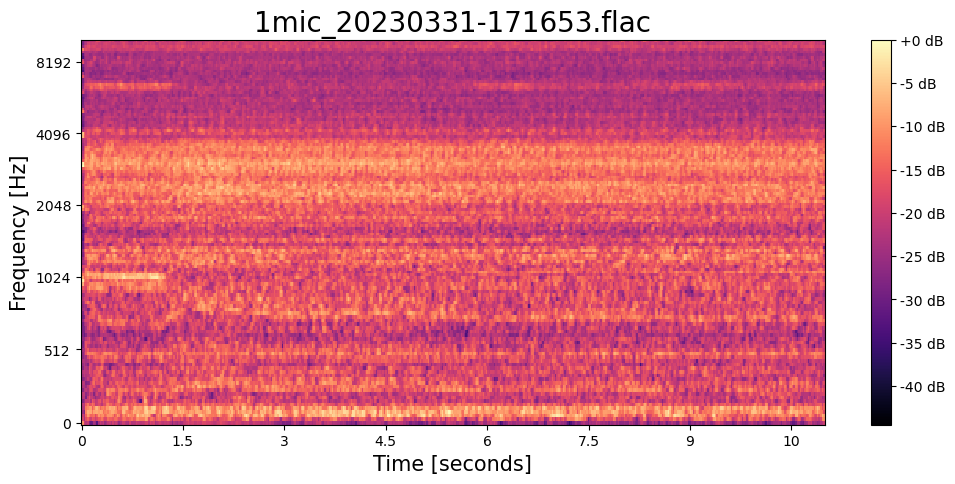

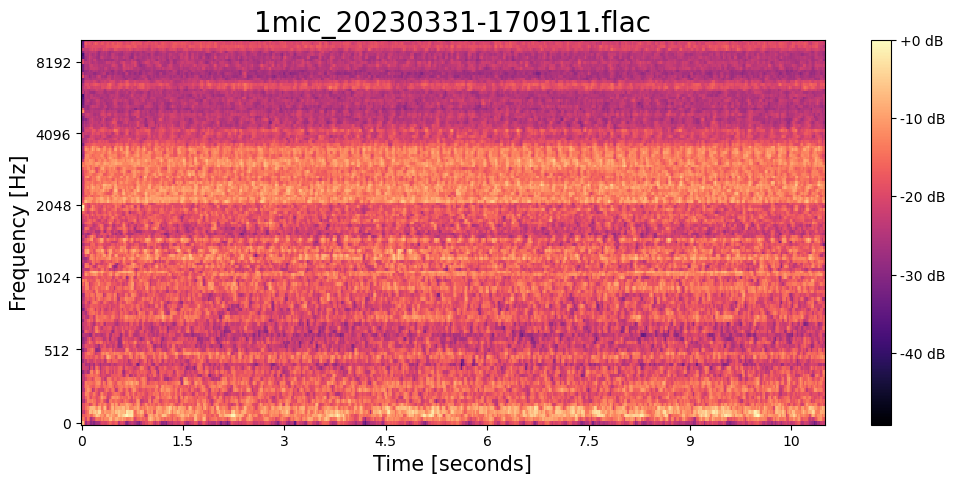

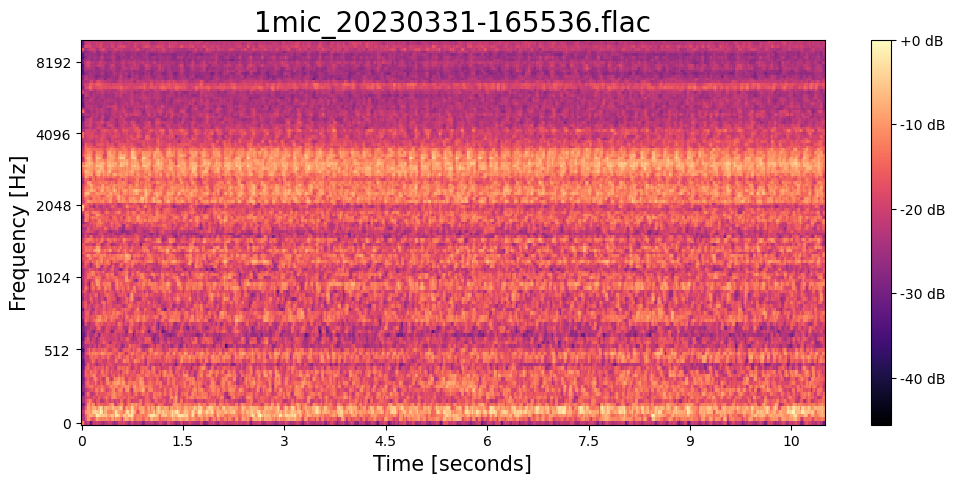

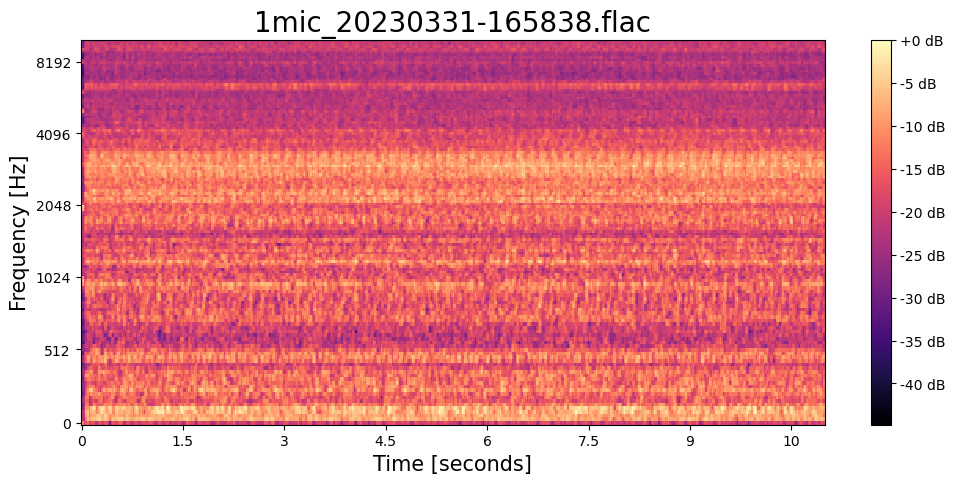

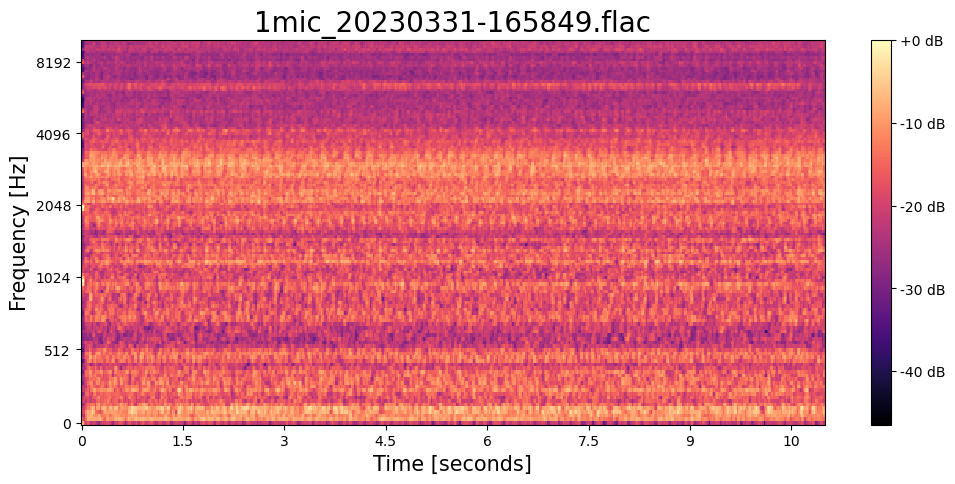

In [14]:
for f in most_normal_lof:
    plot_melspectr(f, sr=22050, mono=True, n_mels=128, fmax=10000)

## INNE - Isolation-based Anomaly Detection Using Nearest-Neighbor Ensembles, Outlier Ensembles, 2018

In [15]:
inne_clf =  INNE() # Outlier Ensembles	INNE	Isolation-based Anomaly Detection Using Nearest-Neighbor Ensembles	2018)
#AutoEncoder(epochs=100) ECOD - плохо iforest-плохо
inne_clf.fit(X_train)

# get the anomaly score on the train data
y_train_scores_inne = inne_clf.decision_scores_ 
anomaly_scores_inne = pd.DataFrame(y_train_scores_inne, columns=['anomaly_score'])
anomaly_scores_inne['file_name'] = file_names

In [16]:
anomaly_scores_inne = anomaly_scores_inne.sort_values(by='anomaly_score', ascending=False)

# Top 10 anomaly sounds
most_anomaly_inne = list(anomaly_scores_inne['file_name'].astype(str).values[:10])

# Top 10 normal sounds
most_normal_inne = list(anomaly_scores_inne['file_name'].astype(str).values[-10:])
print(f'Most Anomaly files:')
[print(f'{i}') for i in most_anomaly_inne]

print(f'\n Most Normal files:')
[print(f'{i}') for i in most_normal_inne]

Most Anomaly files:
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-172625.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-173659.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-165432.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-173511.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-172557.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-165453.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-171935.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-165226.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-165259.flac
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_20230331-171033.flac

 Most Normal files:
c:\Users\alina\Thesis\Диплом\datasets\my_dataset\flac\blocking_1mic_2

[None, None, None, None, None, None, None, None, None, None]

## TOP 10 Anomal sounds

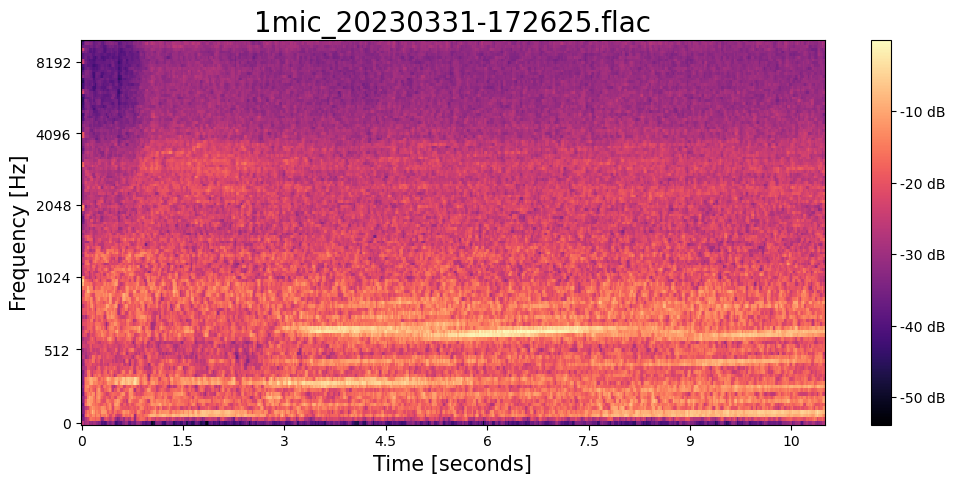

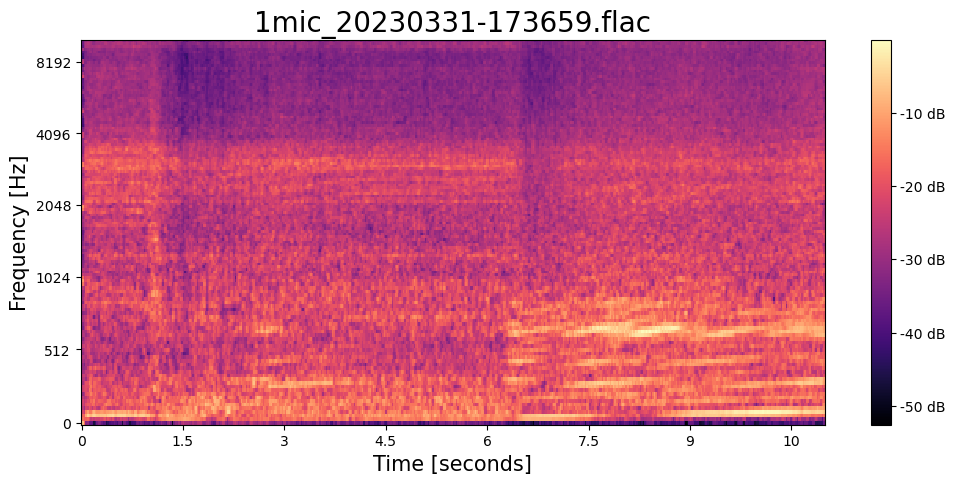

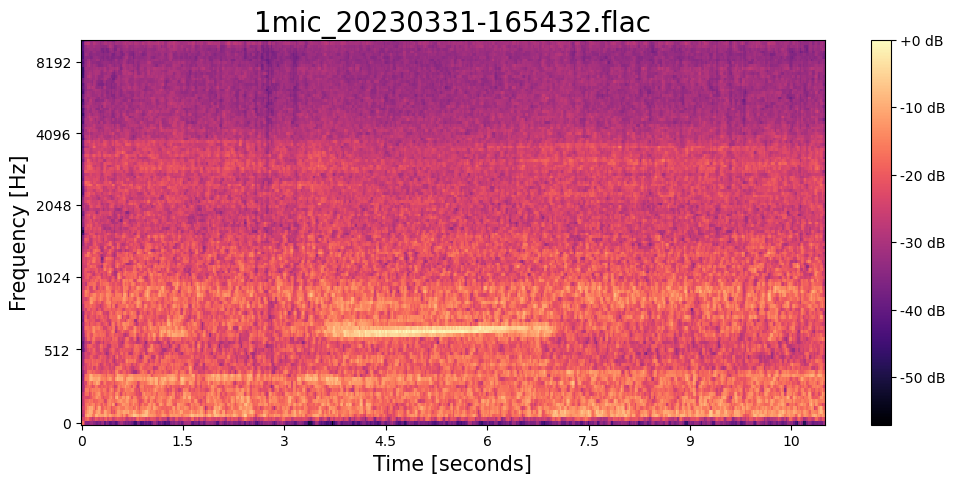

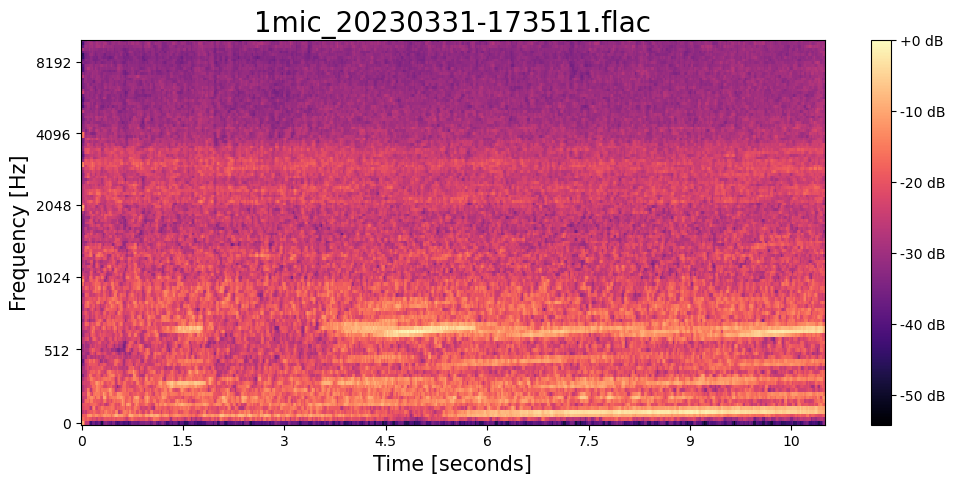

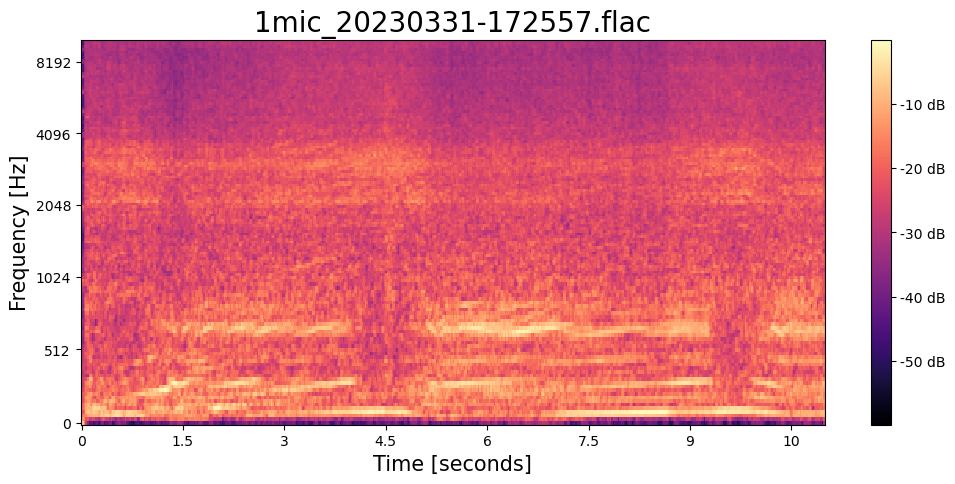

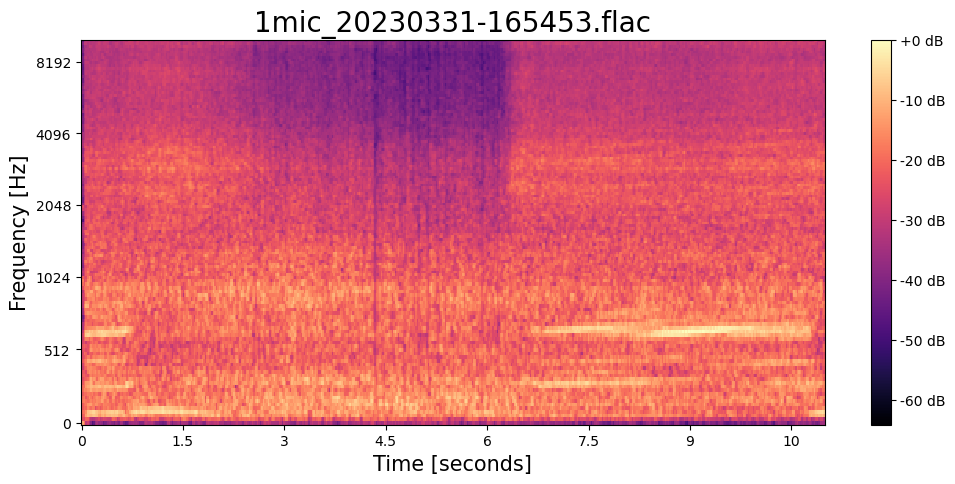

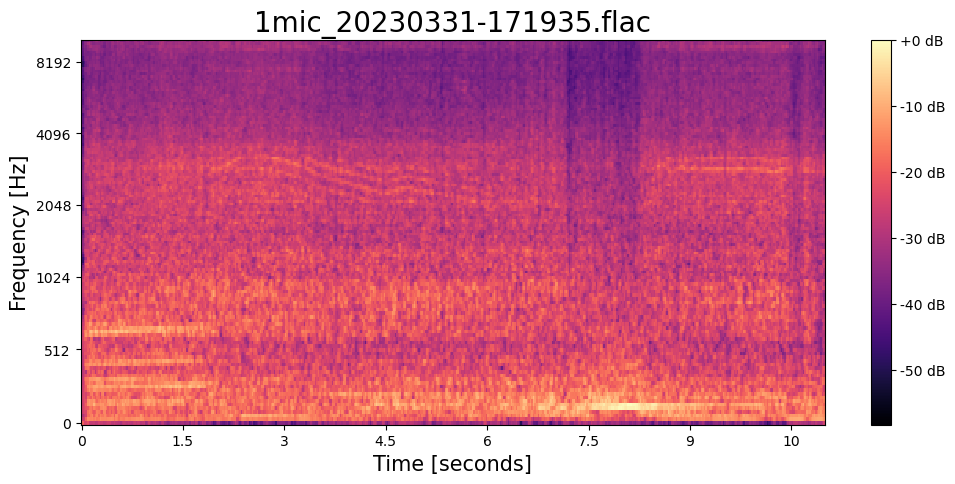

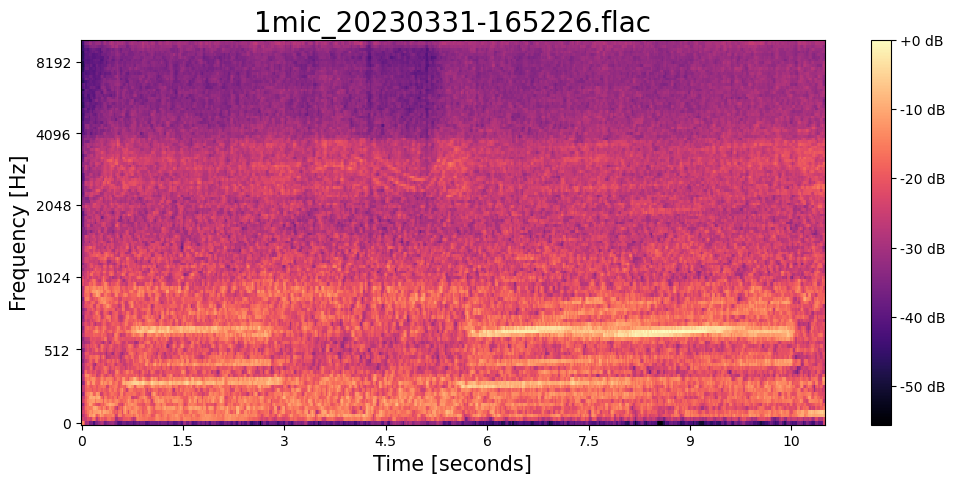

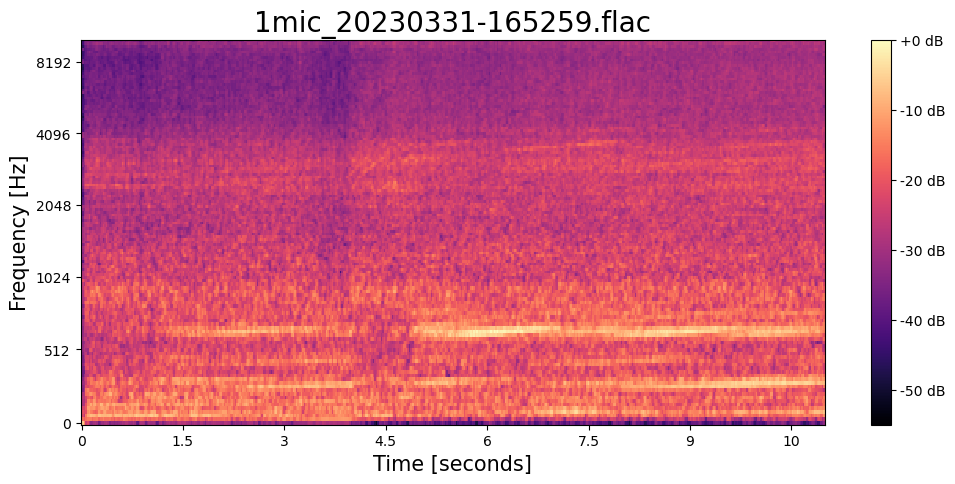

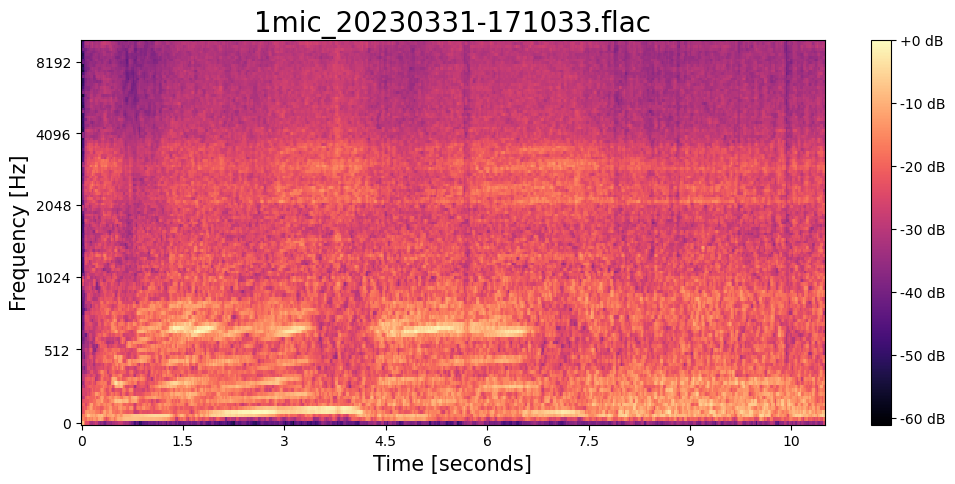

In [17]:
for f in most_anomaly_inne:
    plot_melspectr(f, sr=22050, mono=True, n_mels=128, fmax=10000)

## TOP 10 Normal sounds

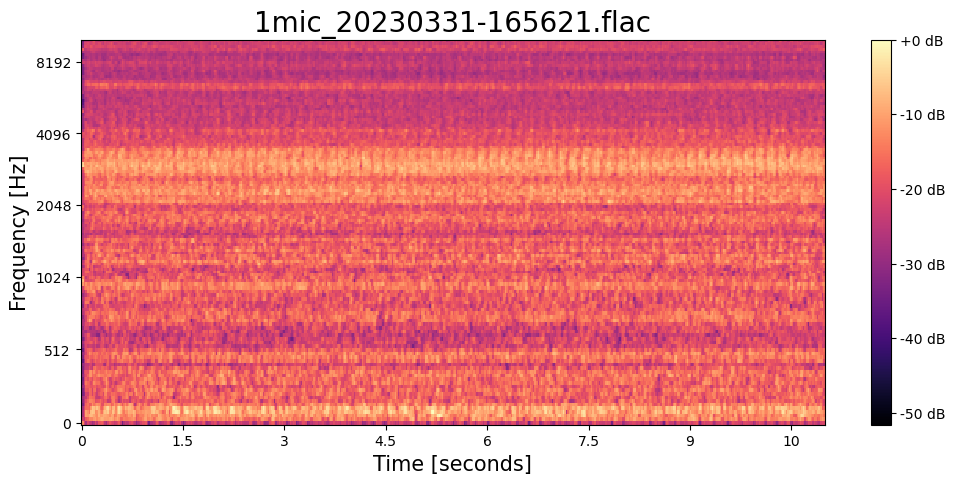

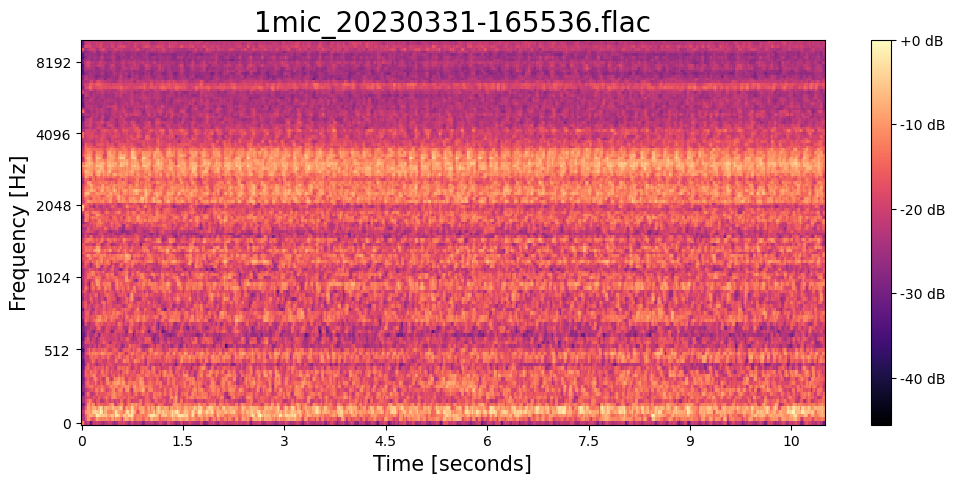

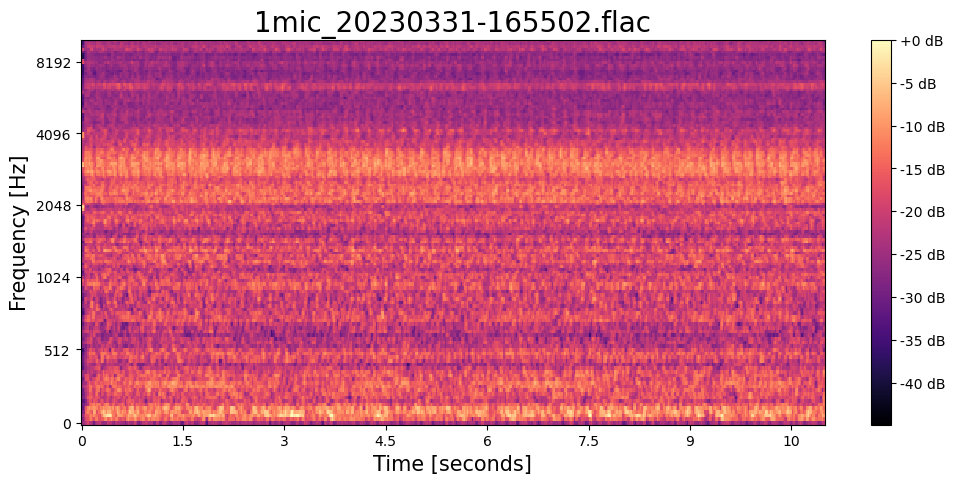

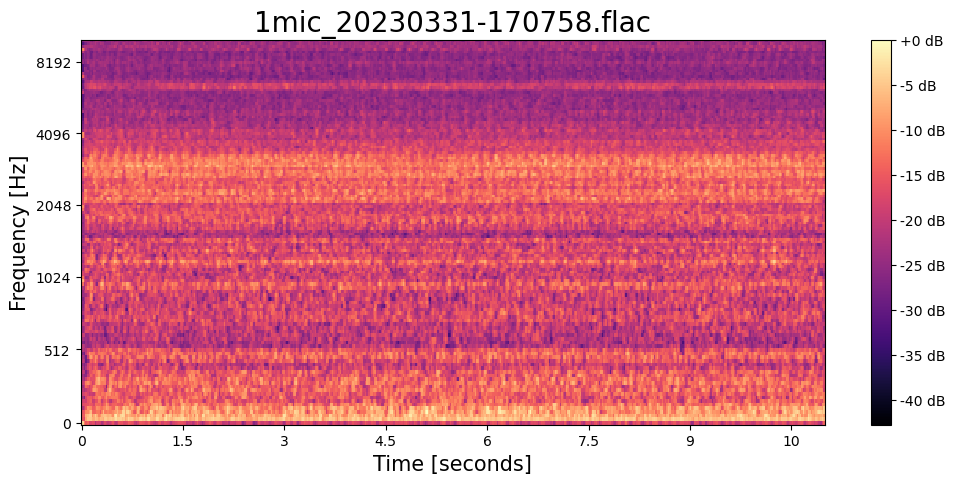

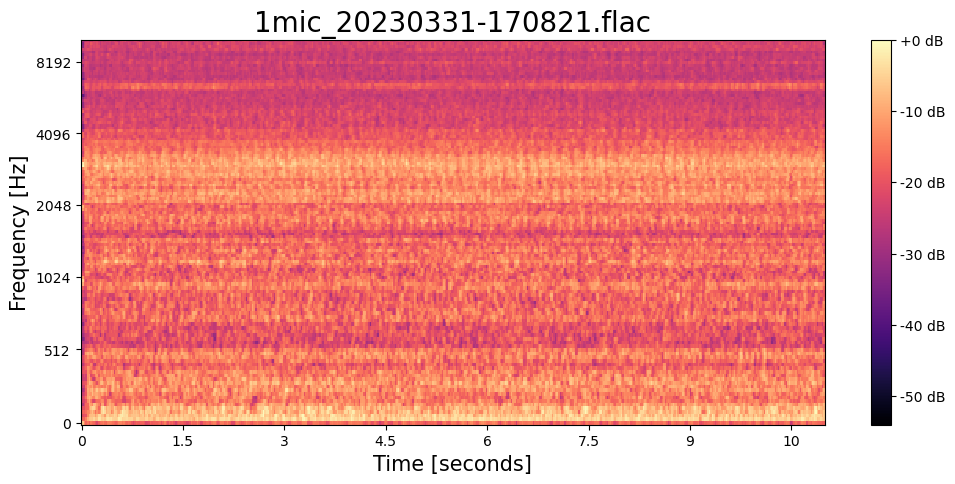

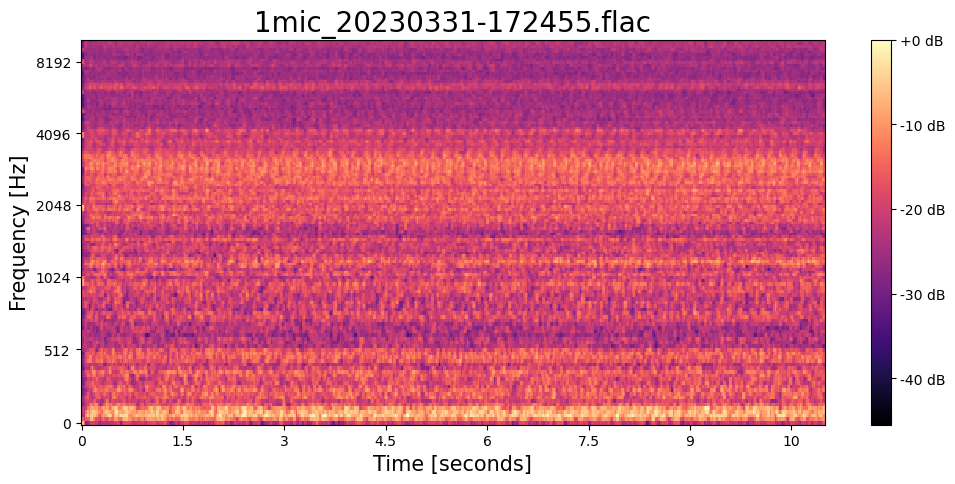

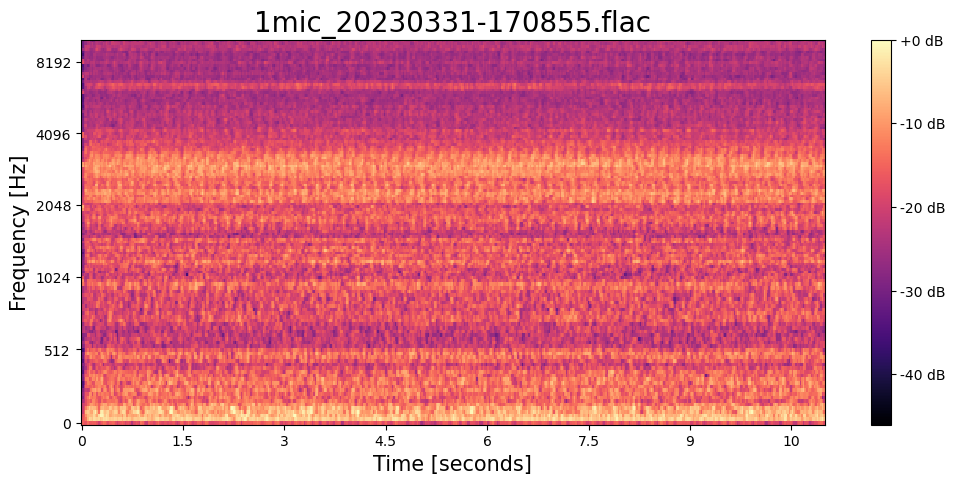

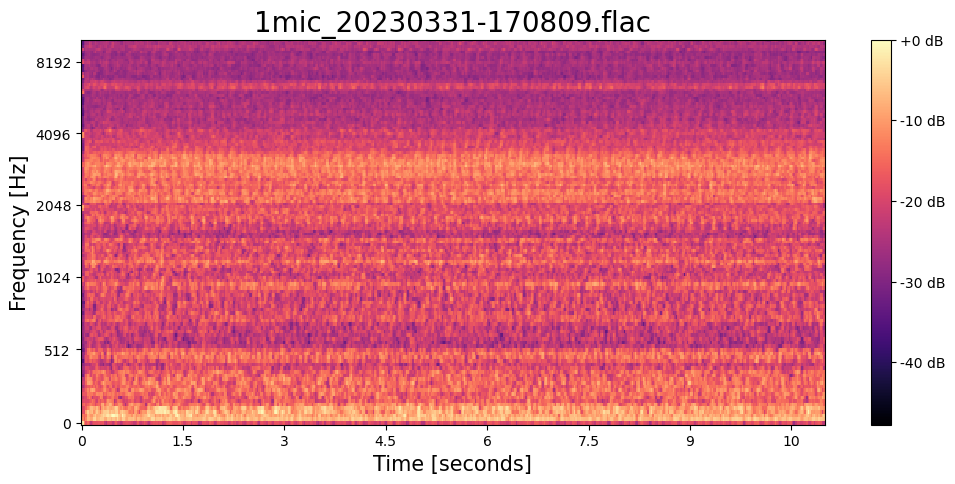

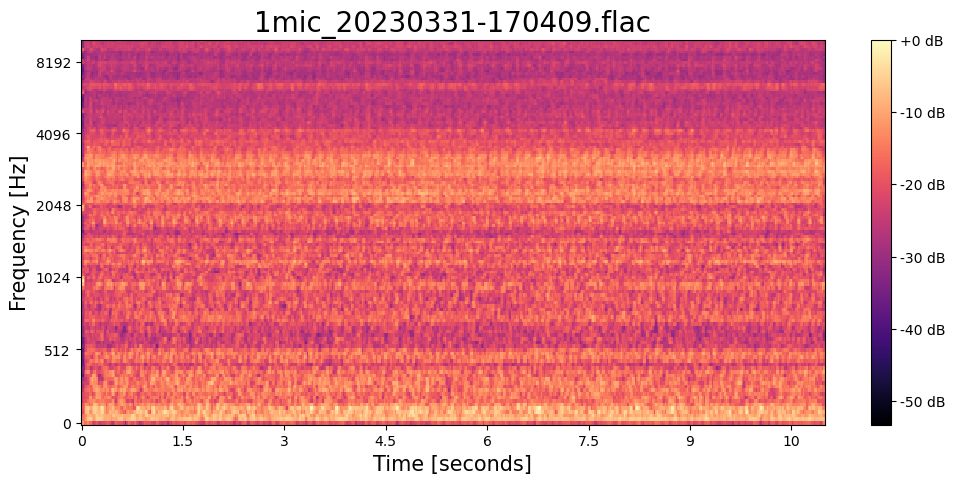

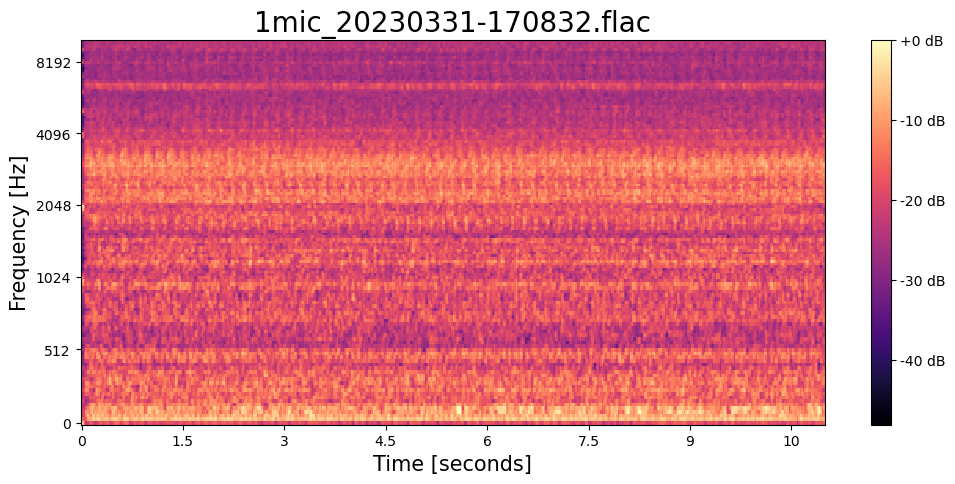

In [18]:
for f in most_normal_inne:
    plot_melspectr(f, sr=22050, mono=True, n_mels=128, fmax=10000)